# Pursuit Problem

In [115]:
import numpy as np

from scipy.integrate import solve_ivp
from scipy.interpolate import make_interp_spline

import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

%matplotlib inline

Consider the problem involving a target and a pursuer such that the pursuer is moving in a way that its direction of motion is always towards the target. 

The problem is to determine the trajectory of the pursuer given the initial position of the pursuer and the position vector of the target as a function of time:

$$ T(t) = (x_T(t), y_T(t), z_T(t))$$

Where $x_T(t), y_T(t),$ and $z_T(t)$ are known functions describing the path of the target.

In [116]:
def target(t):
    #
    # Example trajectory of the target (Helix)
    # 
    return np.array([np.sin(t), np.cos(t), t])

In [117]:
def rocket(t,P,SP,DMIN):
    #
    # This is the function that is called by the ODE solver.
    # It implements the differential equations defining
    # the trajectory of the pursuer.
    #
    # t: time
    # P: position of the pursuer
    # SP: Speed of the pursuer
    #
    # DMIN is not used here
    #   
    target_pos = target(t)
    dist = np.sqrt((target_pos[0] - P[0])**2 + (target_pos[1] - P[1])**2 + (target_pos[2] - P[2])**2) 
    return np.array([(SP / dist) * (target_pos[0] - P[0]), (SP / dist) * (target_pos[1] - P[1]), (SP / dist) * (target_pos[2] - P[2])])
    

In [118]:
def rocket_events(t,P,SP,DMIN):
    #
    # This is the event function.
    # When the rocket gets within DMIN of the target,
    # it records the time t at which this happens, and
    # terminates the ODE solver.
    #
    # t: time
    # P: position of pursuer
    # SP is not used here
    #
    target_pos = target(t)
    dist = np.sqrt((target_pos[0] - P[0])**2 + (target_pos[1] - P[1])**2 + (target_pos[2] - P[2])**2)
    return np.array([dist - DMIN]) 
    

In [119]:
def animate(n,t,P):
    #
    # Plot the trajectory of the pursuer and target
    #
    # n: n-th frame of the animation
    # t[n]: time of n-th frame
    # P[n]: coordinates of the pursuer at time t[n]
    #
    T = target(t[n])
    Tx = [T[0]]; Ty = [T[1]]; Tz = [T[2]]
    Px = [P[n][0]]; Py = [P[n][1]]; Pz = [P[n][2]]
    
    ax.plot(Px, Py, Pz, 'go')
    ax.plot(Tx, Ty, Tz, 'bx')

For speed SP = 1.4, RK23:
Number of time steps: 153
Number of evaluations of the RHS: 463
No intercept detected.

For speed SP = 1.4, RK45:
Number of time steps: 36
Number of evaluations of the RHS: 223
No intercept detected.

For speed SP = 1.5, RK23:
Number of time steps: 143
Number of evaluations of the RHS: 433
Time of intercept: 12.547893914163856

For speed SP = 1.5, RK45:
Number of time steps: 46
Number of evaluations of the RHS: 289
Time of intercept: 12.5401252627503

For speed SP = 1.6, RK23:
Number of time steps: 96
Number of evaluations of the RHS: 292
Time of intercept: 8.280705438086985

For speed SP = 1.6, RK45:
Number of time steps: 29
Number of evaluations of the RHS: 193
Time of intercept: 8.278235585817674

For speed SP = 1.7, RK23:
Number of time steps: 75
Number of evaluations of the RHS: 229
Time of intercept: 6.32300670570882

For speed SP = 1.7, RK45:
Number of time steps: 23
Number of evaluations of the RHS: 193
Time of intercept: 6.321891719613922



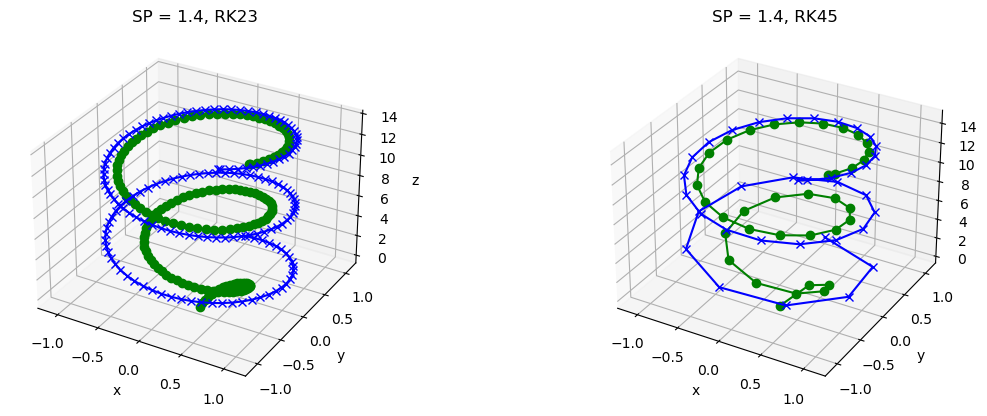

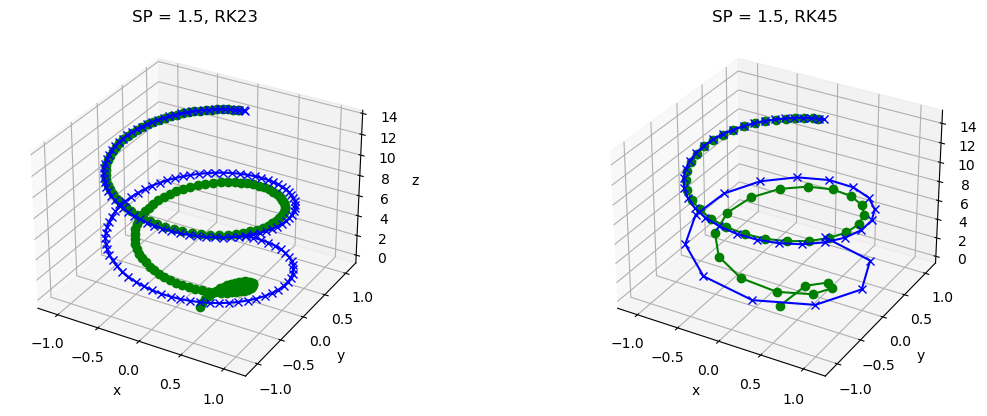

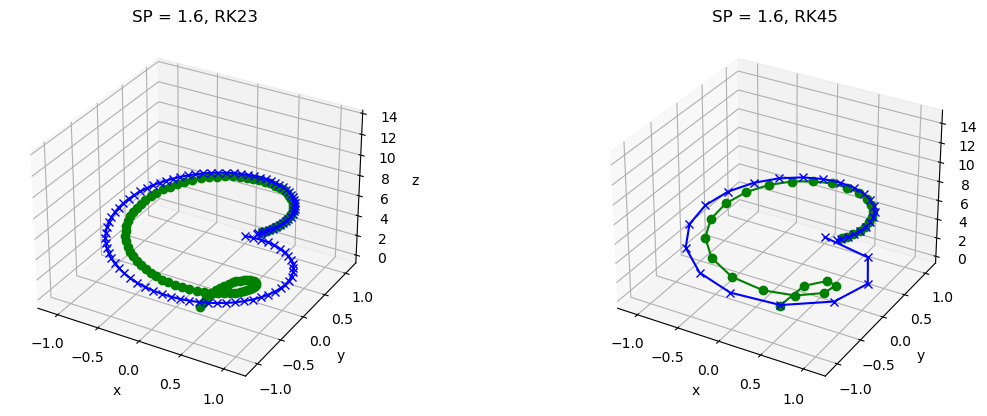

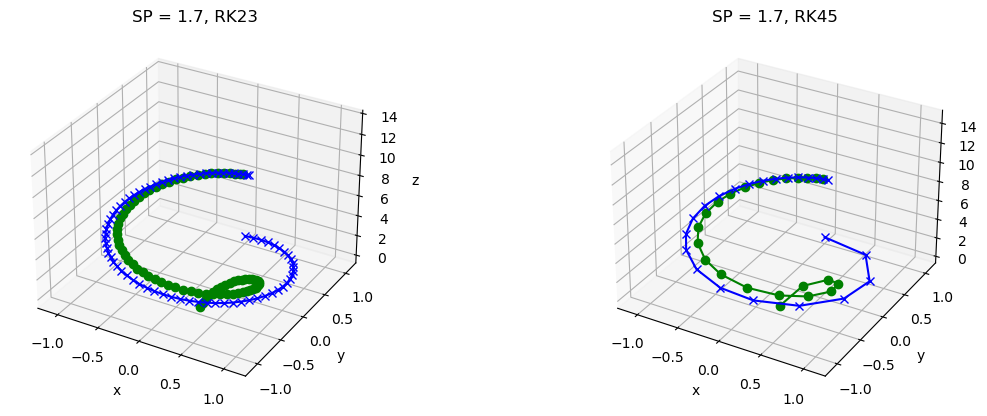

In [120]:
#
# Main program
#

#
# Set up parameter values for the pursuit problem
# t0, tfinal, etc
#
t0 = 0
tfinal = 15
pos_init = np.array([0, 0, -3])
DMIN = 0.1
#
# Set up parameter values for the ODE solver
# abs tol, rel tol, etc
#
abs_tol = 1e-5
rel_tol = 1e-5
init_step_size = 1
max_step_size = 1
rocket_events.terminal = True
#
# Solving ODEs
#
for SP in [1.4, 1.5, 1.6, 1.7]:
    #
    # Call ode solvers:
    # sol1 = solve_ivp( ... method = 'RK23' ... )
    # sol2 = solve_ivp( ... method = 'RK45' ... )
    #
    sol1 = solve_ivp(
        rocket,
        t_span = [t0, tfinal],
        y0 = pos_init,
        method = 'RK23',
        atol = abs_tol,
        rtol = rel_tol,
        first_step = init_step_size,
        max_step = max_step_size,
        events = rocket_events,
        args = (SP, DMIN)
    )
    sol2 = solve_ivp(
        rocket,
        t_span = [t0, tfinal],
        y0 = pos_init,
        method = 'RK45',
        atol = abs_tol,
        rtol = rel_tol,
        first_step = init_step_size,
        max_step = max_step_size,
        events = rocket_events,
        args = (SP, DMIN)
    )
    #
    # Display numerical results
    # number of time steps, number of evaluations, time of intercept
    #
    print(f"For speed SP = {SP}, RK23:")
    print(f"Number of time steps: {len(sol1.t)}")
    print(f"Number of evaluations of the RHS: {sol1.nfev}")
    if sol1.t_events[0].size > 0:
        print(f"Time of intercept: {sol1.t_events[0][0]}\n")
    else:
        print("No intercept detected.\n")

    print(f"For speed SP = {SP}, RK45:")
    print(f"Number of time steps: {len(sol2.t)}")
    print(f"Number of evaluations of the RHS: {sol2.nfev}")
    if sol2.t_events[0].size > 0:
        print(f"Time of intercept: {sol2.t_events[0][0]}\n")
    else:
        print("No intercept detected.\n")
    #
    # Display trajectories of 
    # Green: pursuer
    # Blue: target
    #
    fig = plt.figure(figsize=plt.figaspect(0.35))
    ax1 = fig.add_subplot(1,2,1, projection='3d')
    ax1.set_xlim3d(-1.2,1.2)
    ax1.set_ylim3d(-1.2,1.2)
    ax1.set_zlim3d(-0.5,14)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_zlabel('z')
    ax1.set_title('SP = %.1f, RK23' %(SP))
    P1x, P1y, P1z = sol1.y
    ax1.plot3D(P1x, P1y, P1z, 'go-')
    Tx, Ty, Tz = target(sol1.t)
    ax1.plot3D(Tx, Ty, Tz, 'bx-')   
    
    ax2 = fig.add_subplot(1,2,2, projection='3d')
    ax2.set_xlim3d(-1.2,1.2)
    ax2.set_ylim3d(-1.2,1.2)
    ax2.set_zlim3d(-0.4,15)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title('SP = %.1f, RK45' %(SP))
    P2x, P2y, P2z = sol2.y
    ax2.plot3D(P2x, P2y, P2z, 'go-')
    Tx, Ty, Tz = target(sol2.t)
    ax2.plot3D(Tx, Ty, Tz, 'bx-')   

RK45 is more efficient since it requires significantly less time steps and evaluations in order to "catch" the target in the same amount of time.

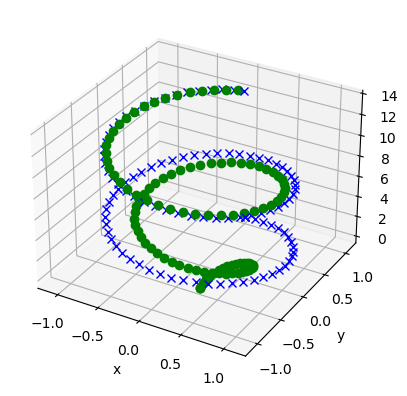

In [121]:
# (This one is just for fun)
#
# Animation of trajectories
# Green: pursuer
# Blue: target
#
fig = plt.figure()

ax = plt.axes(projection='3d')
ax.set_xlim3d(-1.2,1.2)
ax.set_ylim3d(-1.2,1.2)
ax.set_zlim3d(-0.4,14)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

#
# Solve the ODE for SP=1.5
#
SP = 1.5
sol = solve_ivp(
    rocket,
    t_span = [t0, tfinal],
    y0 = pos_init,
    method = 'RK45',
    atol = abs_tol,
    rtol = rel_tol,
    first_step = init_step_size,
    max_step = max_step_size,
    events = rocket_events,
    args = (SP, DMIN)
)
t = sol.t
P = sol.y.T
n = np.size(t)

m = 100
cs = make_interp_spline(t,P)
tt = np.linspace(t[0],t[n-1],m)
PP = cs(tt)

# Create animation
anim = animation.FuncAnimation(fig, animate, frames = m, fargs = (tt, PP,), interval=100)
HTML(anim.to_jshtml())